# Proyek Analisis Data: Nama dataset
- Nama: Nanda Dwi Putra Miskarana Ade
- Email: nanda.dpma@gmail.com
- Id Dicoding: nandadpma

## Menentukan Pertanyaan Bisnis

- Kapan terakhir kali customer bertransaksi (Recency)
- Berapa banyak uang yang sudah dikeluarkan customer untuk bertransaksi (Monetary)

## Menyiapkan semua library yang dibutuhkan

In [1]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import streamlit as st
from scipy import stats
from sklearn.preprocessing import power_transform, MinMaxScaler, StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

import all necessary library

## Data Wrangling

### Gathering Data

In [2]:
def access_file(public_url, localdir):
  file_id_url = public_url.split('/')[-2]
  try:
    return pd.read_csv(localdir)
  except:
    return pd.read_csv('https://drive.google.com/uc?id=' + file_id_url)

order_df = access_file('https://drive.google.com/file/d/1e4HEj3s5mfNUiUp0M1Xgfzk65nTlm7uq/view?usp=sharing','Dataset/orders_dataset.csv')
payment_df = access_file('https://drive.google.com/file/d/1vra0mZEAR6_bIFaDgRRP6O37A35HkQgq/view?usp=sharing','Dataset/order_payments_dataset.csv')
customer_df = access_file('https://drive.google.com/file/d/1IzClH4iJ4a34aPQ9WudSFshtTUDiil40/view?usp=sharing','Dataset/customers_dataset.csv')

import all necessary dataset

### Assessing Data

In [3]:
order_df.info()
print(f'\nDuplicated Rows : {order_df.duplicated().sum()}')
print(f'\nOrder Status\n',order_df.order_status.value_counts(),'\n')
order_df.info()
payment_df.info()
customer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB

Duplicated Rows : 0

Order Status
 delivered      96478
shipped         1107
canceled         625
unavailable      609
invoiced         314
processing       301
created            5
approved           2
Name: order_status, dtype: int64 

<class 'pandas.core.fra

examines the structure of the dataset and checks if there is any NaN

In [4]:
new_order = pd.merge(order_df, payment_df, on='order_id', how='left')
customer_order_freq = new_order.groupby(['customer_id']).agg(order_freq=('order_id','nunique')).reset_index()
customer_total_spending = new_order.groupby(['customer_id']).agg(total_spending=('payment_value','sum')).reset_index()
customer_order_details = pd.merge(customer_order_freq, customer_total_spending, on='customer_id', how='left')
new_order['order_purchase_timestamp'] = pd.to_datetime(new_order.order_purchase_timestamp)
recent_order = new_order.groupby(['customer_id']).agg(recent_order=('order_purchase_timestamp','max')).reset_index()
recent_order['recency'] = (new_order.order_purchase_timestamp.max()-recent_order.recent_order).dt.days
customer_order_details = customer_order_details.merge(recent_order[['customer_id','recency']], on='customer_id', how='left')
customer_order_details

,customer_id,order_freq,total_spending,recency
0,00012a2ce6f8dcda20d059ce98491703,1,114.74,337
1,000161a058600d5901f007fab4c27140,1,67.41,458
2,0001fd6190edaaf884bcaf3d49edf079,1,195.42,596
3,0002414f95344307404f0ace7a26f1d5,1,179.35,427
4,000379cdec625522490c315e70c7a9fb,1,107.01,198
...,...,...,...,...
99436,fffecc9f79fd8c764f843e9951b11341,1,81.36,202
99437,fffeda5b6d849fbd39689bb92087f431,1,63.13,148
99438,ffff42319e9b2d713724ae527742af25,1,214.13,126
99439,ffffa3172527f765de70084a7e53aae8,1,45.50,410


extract order_frequency, total_spending and recency for each customer_id using pd.groupby

In [5]:
df = pd.merge(customer_df, new_order, on='customer_id', how='left')
df = pd.merge(df, customer_order_details, on='customer_id', how='left')
df.info()
df.sample(10)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 103887 entries, 0 to 103886
Data columns (total 19 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   customer_id                    103887 non-null  object        
 1   customer_unique_id             103887 non-null  object        
 2   customer_zip_code_prefix       103887 non-null  int64         
 3   customer_city                  103887 non-null  object        
 4   customer_state                 103887 non-null  object        
 5   order_id                       103887 non-null  object        
 6   order_status                   103887 non-null  object        
 7   order_purchase_timestamp       103887 non-null  datetime64[ns]
 8   order_approved_at              103712 non-null  object        
 9   order_delivered_carrier_date   101999 non-null  object        
 10  order_delivered_customer_date  100755 non-null  object        
 11  

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_sequential,payment_type,payment_installments,payment_value,order_freq,total_spending,recency
21797,e60d2d68c3408aae095b3669023f5aab,03608653642e4fea136e39e9382d74f2,6182,osasco,SP,8fc3ff1d28b1b197058c88cc2d66a07b,delivered,2017-05-08 22:26:43,2017-05-08 22:35:09,2017-05-22 13:58:02,2017-05-26 06:52:00,2017-06-22 00:00:00,1.0,credit_card,1.0,26.21,1,72.05,526
37087,fe2edb873d4b148dbddecf2946491360,c916dbec32e3ef41af6e7b07b9adab31,8900,guararema,SP,3d7a0606016fe5d209e5224ffe77f7cc,delivered,2018-02-14 17:11:41,2018-02-14 17:28:07,2018-02-16 17:48:32,2018-02-21 21:49:06,2018-03-07 00:00:00,1.0,credit_card,1.0,46.75,1,46.75,245
65172,b4b3f6026dad88e08fb993834e90cff6,a354d0eff6173f21e2d3cd9143b080f9,84172,castro,PR,59d94d0f87dcdb43dcc6bca8a0cb2a0c,delivered,2018-05-31 16:21:44,2018-05-31 16:30:43,2018-06-01 14:01:00,2018-06-17 08:51:00,2018-07-16 00:00:00,1.0,debit_card,1.0,109.82,1,109.82,139
18748,7a016e0365d83ace51004c940f13aff3,b8d87455f7eca8954cb5963ed9f9f9a5,71931,brasilia,DF,dfd5653b035d78ae9984f014e5903709,delivered,2017-04-10 01:23:48,2017-04-10 01:35:19,2017-04-10 10:20:05,2017-04-13 12:54:11,2017-05-12 00:00:00,1.0,credit_card,5.0,382.38,1,382.38,555
17607,da70cbcb5012f2055b4f2c90d28725fc,cf3ca218511c73ca4a1c6a19e71f02d4,37060,varginha,MG,d0fc18b01244d3a08b0fd12deede8201,delivered,2016-10-06 07:08:15,2016-10-07 03:09:23,2016-10-21 16:18:05,2016-10-31 11:27:54,2016-11-30 00:00:00,1.0,boleto,1.0,129.16,1,129.16,741
36669,855fd5747207a6fde9c90bdc1bde58f6,0252e35d8aa0b7b19eb4fb96783bafca,25050,duque de caxias,RJ,1db5f7be6c0e5b942a24957fae155f28,delivered,2017-06-08 08:58:53,2017-06-09 02:30:28,2017-06-12 14:54:35,2017-06-14 14:12:19,2017-06-29 00:00:00,1.0,boleto,1.0,69.17,1,69.17,496
36745,2b83d4c1da04d92aceb19710d0a59ef9,bb9c04f0a50c8023b09d2c7439cc4b2c,5419,sao paulo,SP,b777b7d618ee48ec7cf64aeb188e9da5,delivered,2018-08-09 11:47:22,2018-08-09 14:26:08,2018-08-09 14:24:00,2018-08-10 15:41:50,2018-08-15 00:00:00,1.0,credit_card,1.0,94.76,1,94.76,69
78521,e8a101d3de305ff620d4febe10137fd0,f93b9c409efa7e30bf05a7b528197400,14110,bonfim paulista,SP,0103878b7ed86b6ec873cfae01379472,delivered,2018-08-16 00:03:16,2018-08-16 00:15:41,2018-08-17 13:25:00,2018-08-22 22:38:43,2018-08-31 00:00:00,1.0,credit_card,1.0,265.36,1,265.36,62
69403,9176004cfff177c805ac4a76bef471f4,df9186bb707702970febf194eefa749c,22031,rio de janeiro,RJ,04d49c33fa60bbc46ab8514d0811d0e3,delivered,2018-05-03 17:28:08,2018-05-03 17:54:12,2018-05-08 13:52:00,2018-05-17 18:36:43,2018-06-06 00:00:00,1.0,credit_card,1.0,46.56,1,46.56,167
55888,2219a3cc521a24bad7f19a67dc498e5d,7f400c7204b3881600bf1ae221e1e878,36048,juiz de fora,MG,063bbb83c80ba8c04934c9ff389be77a,delivered,2018-02-07 08:52:01,2018-02-07 09:09:39,2018-02-09 00:06:00,2018-02-19 22:22:11,2018-03-07 00:00:00,1.0,credit_card,4.0,69.12,1,69.12,252


join new dataframe and order_dataset based on customer_id using pd.merge

### Cleaning Data

In [6]:
def get_minmax_scaler(df, columns):
  scaler = {}
  for col in columns:
    scaler[col] = MinMaxScaler().fit( np.array(df[col]).reshape(-1,1) )
  return scaler

def get_std_scaler(df, columns):
  scaler = {}
  for col in columns:
    scaler[col] = StandardScaler().fit( np.array(df[col]).reshape(-1,1) )
  return scaler

def apply_transform(scaler, df, prefix=None):
  temp_df = df.copy()
  for col in scaler.keys():
    temp_df[col+prefix] = scaler[col].transform( np.array(df[col]).reshape(-1,1) )
  return temp_df

def apply_log_transform(df, columns):
  temp_df = df.copy()
  for col in columns:
    temp_df[col+'_log'] = abs( np.log(temp_df[col]+1) )
  return temp_df

def zscore_remove_outliers(df, columns):
    temp_df = df.copy()
    inliers = np.array([True] * len(df))
    for col in columns:
        zscore = abs(stats.zscore(df[col]))
        inliers = (zscore < 3) & inliers
    temp_df = df[inliers]
    return temp_df


def show_boxplot(df,features):
  plt.figure(figsize=(30, 5))
  for i in range(0, len(features) ):
      plt.subplot(1, len(features) , i+1)
      sns.boxplot(y=df[features[i]], color='green', orient='v')
      plt.tight_layout()

def show_kde(df, all_columns, figsize=(30,15), yticks=[]):
  plt.figure(figsize=figsize)
  for col_name, index in zip(all_columns, range(len(all_columns))):
      plt.subplot( math.ceil(len(all_columns)/6), 6, index+1)
      sns.kdeplot(x=df[col_name], color='green', linewidth=3, fill=True)
      if len(yticks)>0:
        plt.yticks(yticks)
      plt.xlabel(col_name)
  plt.show()

def find_cluster(df, features, n_clusters = range(2,11)):
    inertia = []
    for i in n_clusters:
        k_means = KMeans(n_clusters=i, random_state=0).fit(df[features])
        cluster_labels = k_means.predict(df[features])
        inertia.append(k_means.inertia_)
        print('[ n_cluster={} ] Silhouette Score : {}'.format( i, silhouette_score( df[features] , cluster_labels) ))
        
    plt.figure(figsize=(16, 8))
    sns.lineplot(x=n_clusters, y=inertia, color='#000087', linewidth = 4)
    sns.scatterplot(x=n_clusters, y=inertia, s=300, color='#800000',  linestyle='--')
    plt.show()

In [7]:
new_df = df.copy()
dropped_columns = ['order_purchase_timestamp','order_approved_at','order_delivered_carrier_date','order_delivered_customer_date',
                   'order_estimated_delivery_date']
new_df.drop(columns=dropped_columns,inplace=True)
new_df.info()
print('\nCount NaN Value on Data\n',new_df.isna().sum(),'\n')

new_df.dropna(inplace=True)
print('Count NaN value\n',new_df.isna().sum(),'\n')

<class 'pandas.core.frame.DataFrame'>
Int64Index: 103887 entries, 0 to 103886
Data columns (total 14 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   customer_id               103887 non-null  object 
 1   customer_unique_id        103887 non-null  object 
 2   customer_zip_code_prefix  103887 non-null  int64  
 3   customer_city             103887 non-null  object 
 4   customer_state            103887 non-null  object 
 5   order_id                  103887 non-null  object 
 6   order_status              103887 non-null  object 
 7   payment_sequential        103886 non-null  float64
 8   payment_type              103886 non-null  object 
 9   payment_installments      103886 non-null  float64
 10  payment_value             103886 non-null  float64
 11  order_freq                103887 non-null  int64  
 12  total_spending            103887 non-null  float64
 13  recency                   103887 non-null  i

removed customers with NaN values and removed some features that were no longer relevant

In [8]:
df_temp = new_df.groupby(['customer_unique_id']).agg(n_account=('customer_id','nunique'), total_spending=('total_spending','sum'), recency=('recency','min'), order_freq=('order_freq','sum')).reset_index()
df_temp.sort_values(by='n_account',ascending=False)

,customer_unique_id,n_account,total_spending,recency,order_freq
52972,8d50f5eadf50201ccdcedfb9e2ac8455,17,927.63,57,17
23472,3e43e6105506432c953e165fb2acf44c,9,1172.66,231,9
37797,6469f99c1f9dfae7733b25662e7f1782,7,758.83,111,7
76081,ca77025e7201e3b30c44b472ff346268,7,1122.72,138,7
10354,1b6c7548a2a1f9037c1fd3ddfed95f33,7,1021.12,245,8
...,...,...,...,...,...
32508,5657dfebff5868c4dc7e8355fea865c4,1,105.38,340,1
32507,5657596addb4d7b07b32cd330614bdf8,1,189.26,348,1
32506,5656eb169546146caeab56c3ffc3d268,1,128.87,83,1
32505,5656a8fabc8629ff96b2bc14f8c09a27,1,28.13,321,1


found that customer_id is not unique but customer_unique_id is, I think customer_unique_id is 'NIK' and based on E-Commerce policy, a NIK can be registered in multiple accounts that have unique customer_id, so I aggregated the dataframe values by using customer_unique_id

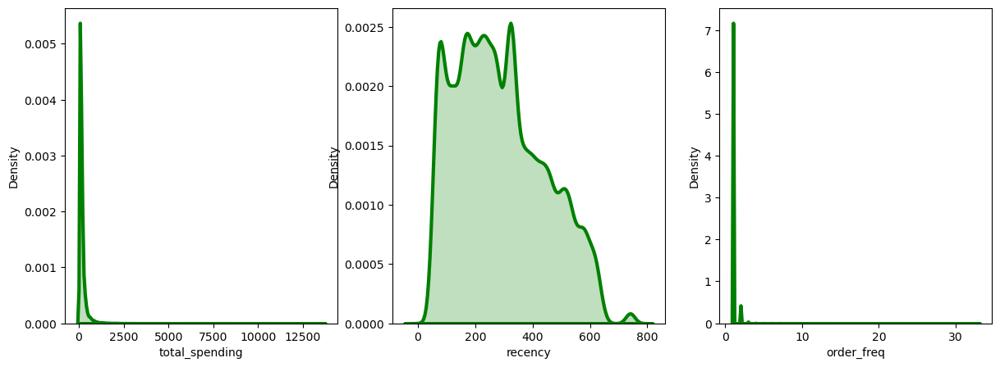

In [9]:
rfm = ['total_spending','recency','order_freq']
show_kde(df_temp, rfm, figsize=(30,5))

i selected only relevant features that are correlated with RFM (Recency, Frequency and Monetary), and then the distribution of those features visualized on kdeplot, based on visualized plot total_spending and order_freq are extremely right-skewed, so i'll do a treatment to those features

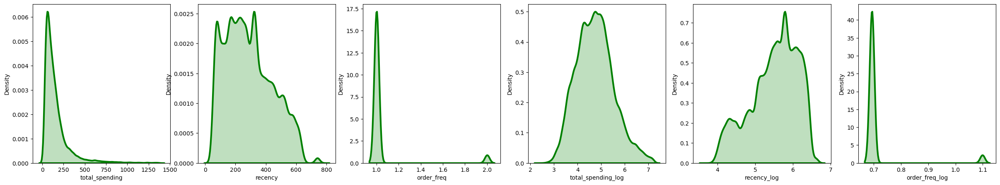

In [10]:
df_temp = apply_log_transform(df_temp, rfm)
df_temp = zscore_remove_outliers(df_temp, [i+'_log'for i in rfm])
show_kde(df_temp, rfm+[i+'_log'for i in rfm], figsize=(30,5))

I performed a log transform to change the distribution on the RFM features to resemble a normal distribution (bell-shaped), and i removed outliers by removing data with value is more than 3

In [11]:
std_scaler = get_std_scaler(df_temp, [i+'_log'for i in rfm])
df_temp = apply_transform(std_scaler, df_temp, prefix='_std')
df_temp

,customer_unique_id,n_account,total_spending,recency,order_freq,total_spending_log,recency_log,order_freq_log,total_spending_log_std,recency_log_std,order_freq_log_std
0,0000366f3b9a7992bf8c76cfdf3221e2,1,141.90,160,1,4.962145,5.081404,0.693147,0.300539,-0.672064,-0.228206
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1,27.19,163,1,3.338967,5.099866,0.693147,-1.769772,-0.642237,-0.228206
2,0000f46a3911fa3c0805444483337064,1,86.22,585,1,4.468434,6.373320,0.693147,-0.329174,1.415145,-0.228206
3,0000f6ccb0745a6a4b88665a16c9f078,1,43.62,369,1,3.798182,5.913503,0.693147,-1.184058,0.672268,-0.228206
4,0004aac84e0df4da2b147fca70cf8255,1,196.89,336,1,5.287711,5.820083,0.693147,0.715788,0.521339,-0.228206
...,...,...,...,...,...,...,...,...,...,...,...
96089,fffcc512b7dfecaffd80f13614af1d16,1,710.70,189,1,6.567656,5.247024,0.693147,2.348316,-0.404490,-0.228206
96091,fffea47cd6d3cc0a88bd621562a9d061,1,84.58,310,1,4.449452,5.739793,0.693147,-0.353385,0.391623,-0.228206
96092,ffff371b4d645b6ecea244b27531430a,1,112.46,617,1,4.731450,6.426488,0.693147,0.006295,1.501044,-0.228206
96093,ffff5962728ec6157033ef9805bacc48,1,133.69,168,1,4.902976,5.129899,0.693147,0.225070,-0.593717,-0.228206


i transformed the data into standardized form to do clustering, because clustering using distance things so standardization is a must

C:\SYS\miniconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[ n_cluster=2 ] Silhouette Score : 0.6538860746804437


C:\SYS\miniconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[ n_cluster=3 ] Silhouette Score : 0.3718353486270366


C:\SYS\miniconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[ n_cluster=4 ] Silhouette Score : 0.38353828048699223


C:\SYS\miniconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[ n_cluster=5 ] Silhouette Score : 0.35131064896853625


C:\SYS\miniconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[ n_cluster=6 ] Silhouette Score : 0.3445317249809037


C:\SYS\miniconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[ n_cluster=7 ] Silhouette Score : 0.35878329565631123


C:\SYS\miniconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[ n_cluster=8 ] Silhouette Score : 0.3537520821441791


C:\SYS\miniconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[ n_cluster=9 ] Silhouette Score : 0.347467964028434


C:\SYS\miniconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[ n_cluster=10 ] Silhouette Score : 0.33431009647209464


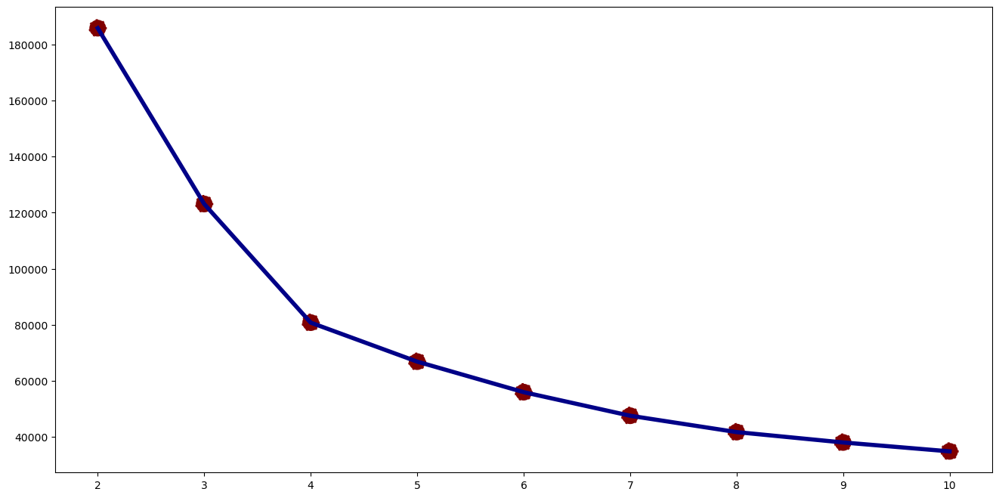

In [12]:
find_cluster(df_temp, [i+'_log_std'for i in rfm])

based on the inertia value, data can be clustered into 3 or 4 clusters

C:\SYS\miniconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


<AxesSubplot: xlabel='total_spending', ylabel='recency'>

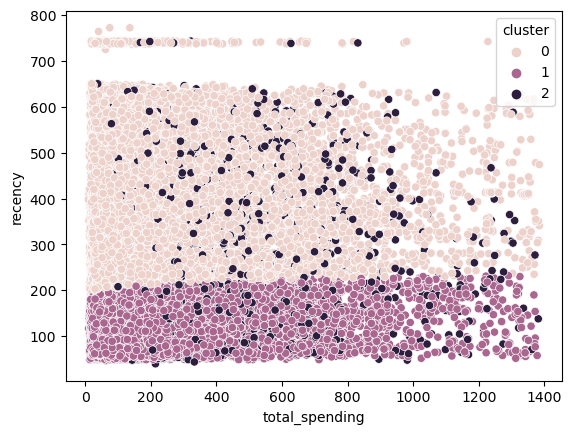

In [13]:
kmeans = KMeans(n_clusters=3, random_state=99).fit(df_temp[[i+'_log_std'for i in rfm]].values)
df_temp['cluster'] = kmeans.labels_
sns.scatterplot(x='total_spending', y='recency', data=df_temp, hue='cluster')

<AxesSubplot: xlabel='recency', ylabel='order_freq'>

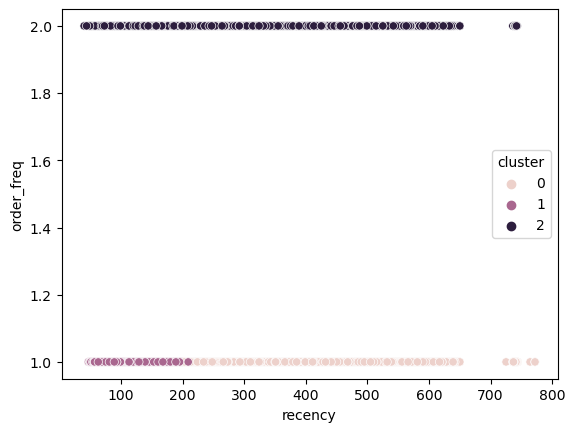

In [14]:
sns.scatterplot(x='recency', y='order_freq', data=df_temp, hue='cluster')

## Exploratory Data Analysis (EDA)

### Explore ...

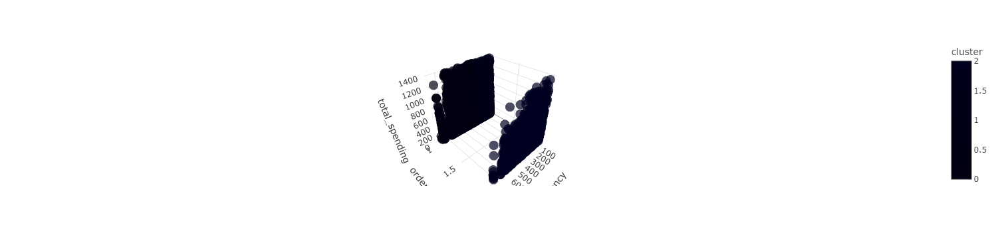

In [15]:
fig = px.scatter_3d(df_temp, x='recency', y='order_freq', z='total_spending',color='cluster', size_max=30, opacity=0.7)
fig.show()

customers clustered into 3 clusters

## Visualization & Explanatory Analysis

### Pertanyaan 1: Kapan terakhir kali customer bertransaksi (Recency)

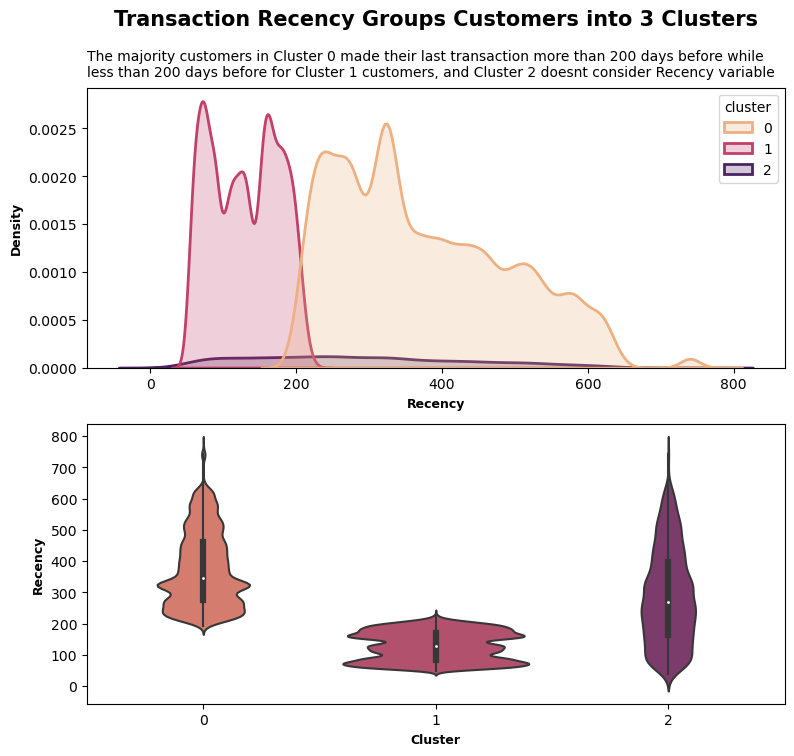


Last Transaction at :  2018-10-17 17:30:18


In [17]:
figure, axes = plt.subplots(2,1, figsize=(9,8))
sns.kdeplot(x='recency',data=df_temp, linewidth=2, fill=True, hue='cluster', ax=axes[0], palette='flare')
sns.violinplot(y='recency', x='cluster', data=df_temp, ax=axes[1], palette='flare')
axes[0].set_title("Transaction Recency Groups Customers into 3 Clusters", fontsize=15, pad=45, fontweight='semibold')
plt.text(x=-0.5, y=1950, fontsize=10,s='The majority customers in Cluster 0 made their last transaction more than 200 days before while\n'+ 
                                        'less than 200 days before for Cluster 1 customers, and Cluster 2 doesnt consider Recency variable')
axes[0].set_xlabel('Recency', fontsize=9, fontweight='semibold')
axes[0].set_ylabel('Density', fontsize=9,fontweight='semibold')
axes[1].set_xlabel('Cluster', fontsize=9, fontweight='semibold')
axes[1].set_ylabel('Recency', fontsize=9,fontweight='semibold')
plt.show()
print('\nLast Transaction at : ',df.order_purchase_timestamp.max())


*   the last transaction occurred at the time the data was collected on October 17
*   the earliest transaction occured until 800 days before the data was collected
*   the cluster 0 consists of customers who made their last transaction more than 200 days earlier
*   the cluster 1 consists of customers who made their last transactions less than 200 days earlier.
*   the Cluster 2 doesn't consider recency but only order freuency



### Pertanyaan 2: Berapa banyak uang yang sudah dikeluarkan customer untuk bertransaksi (Monetary)

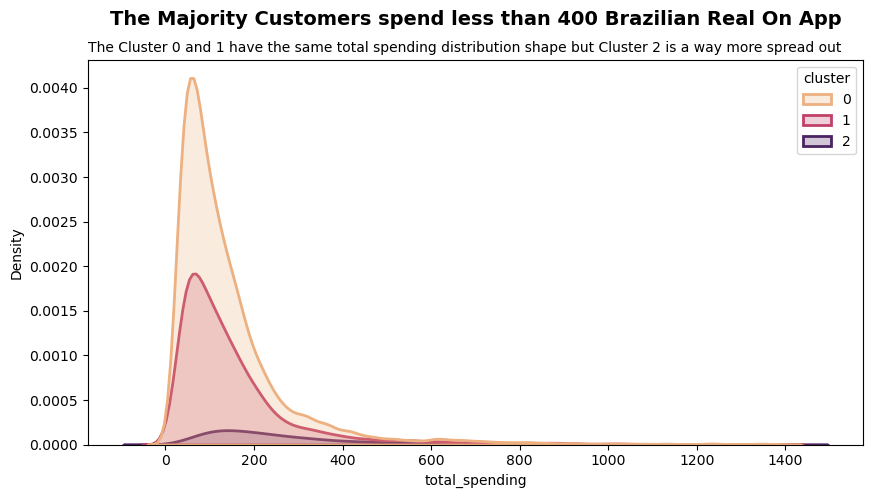

,cluster,median,max,min
0,0,102.015,1384.74,102.015
1,1,112.335,1377.99,112.335
2,2,209.400,1381.41,209.400


In [18]:
plt.figure(figsize=(10,5))
sns.kdeplot(x='total_spending',data=df_temp, linewidth=2, fill=True, hue='cluster', palette='flare')
plt.title("The Majority Customers spend less than 400 Brazilian Real On App", fontsize=14, pad=25, fontweight='semibold')
plt.text(x=-175, y=0.0044, fontsize=10,s='The Cluster 0 and 1 have the same total spending distribution shape but Cluster 2 is a way more spread out')
plt.show()
df_temp.groupby('cluster').agg(median=('total_spending','median'), max=('total_spending','max'), min=('total_spending','median')).reset_index()


*   The Majority of customer using less than 400 Brazilian Real on transaction
*   there is no clear difference in total customer spending across clusters

## Conclusion

- the last transaction occured at the time data was collected untill 800 days before
- The amount that has been spent by customers on E-Commerse varies between 100 until 1400 Brazilian Real, but most customers spend around 400